# Graph Neural Networks - a primer (with `scikit-learn`, `pytorch` and `pyg`)

Main author: **Mihai Alexe**

`firstname.lastname@ecmwf.int`

In [1]:
import os

import h3
import numpy as np
import torch
import torch_geometric
import xarray as xr

from sklearn.neighbors import NearestNeighbors

In [2]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

%matplotlib inline
%config InlineBackend.figure_format='retina'

### An "ERA-like" grid

We load a pre-existing lat/lon grid definition that's been saved as a NpzFile (a numpy array).
The `o96` grid is a reduced octahedral grid used at ECMWF.

https://confluence.ecmwf.int/display/OIFS/4.1+OpenIFS%3A+Gaussian+grids

In [3]:
era_res = 48
grid_type = "o"
era_grid = np.load(f"grid-{grid_type}{era_res}.npz")
era_grid

NpzFile 'grid-o48.npz' with keys: latitudes, longitudes

In [4]:
elat, elon = era_grid["latitudes"], era_grid["longitudes"]
elat.shape, elon.shape

((10944,), (10944,))

In [5]:
ecoords = np.stack([elat, elon], axis=-1).reshape((-1, 2))
ecoords_rad = np.deg2rad(ecoords)
ecoords_rad.shape

(10944, 2)

In [6]:
# sanity check - print the first few coords (in radians!)
# do they look plausible?
ecoords_rad[:10, :]

array([[1.54587597, 0.        ],
       [1.54587597, 0.31415927],
       [1.54587597, 0.62831853],
       [1.54587597, 0.9424778 ],
       [1.54587597, 1.25663706],
       [1.54587597, 1.57079633],
       [1.54587597, 1.88495559],
       [1.54587597, 2.19911486],
       [1.54587597, 2.51327412],
       [1.54587597, 2.82743339]])

### The H3 grid

H3 is a _hierarchical_ geospatial indexing system that partitions the world into hexagonal cells.

The [H3 Core Library](https://h3geo.org/docs/) (used below) implements the H3 grid system. It includes functions for converting from latitude and longitude coordinates to the containing H3 cell, finding the center of H3 cells, finding the boundary geometry of H3 cells, finding neighbors of H3 cells, and more.

https://www.uber.com/en-DE/blog/h3/

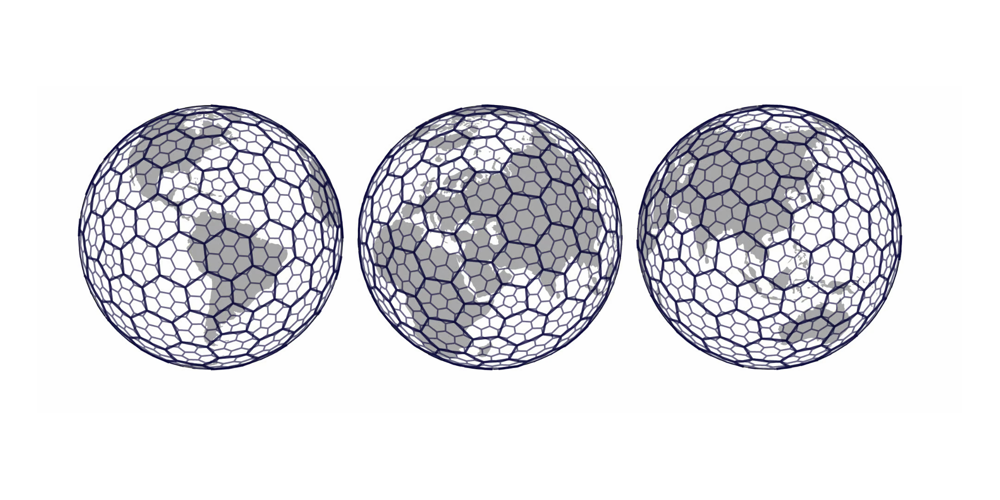

In [7]:
# supported resolutions: https://h3geo.org/docs/core-library/restable/
H_RESOLUTION = 1

# map each point on the ERA grid to its H3 hexagon, then get rid of the duplicates
h3_grid = [h3.geo_to_h3(lat, lon, H_RESOLUTION) for lat, lon in ecoords]
h3_grid = sorted(set(h3_grid))

# convert to latitude / longitude points
# h3_to_geo gets you the lat, lon of the center of a H3 hexagon
# for H_RESOLUTION = 2, you should be left with 5882 lat/lon values
hcoords = np.array([h3.h3_to_geo(val) for val in h3_grid])
hcoords.shape

(842, 2)

### The H3 graph

In [8]:
NUM_H_TO_H_NEIGHBORS = 6

# coordinates must be converted to radians
hcoords_rad = np.deg2rad(hcoords)
    
hneigh = NearestNeighbors(
    n_neighbors=NUM_H_TO_H_NEIGHBORS,
    metric="haversine",  # great circle distance
    n_jobs=2,
)
hneigh.fit(hcoords_rad)
hadjmat = hneigh.kneighbors_graph(hcoords_rad, NUM_H_TO_H_NEIGHBORS, mode="distance").tocoo()

# each node will be connected to its NUM_H_TO_H_NEIGHBORS nearest neighbors, including itself!
# so the "H-to-H" graph adjancency matrix should contain 842 * NUM_H_TO_H_NEIGHBORS nonzero elements
# is this true? check!
hadjmat

<842x842 sparse matrix of type '<class 'numpy.float64'>'
	with 5052 stored elements in COOrdinate format>

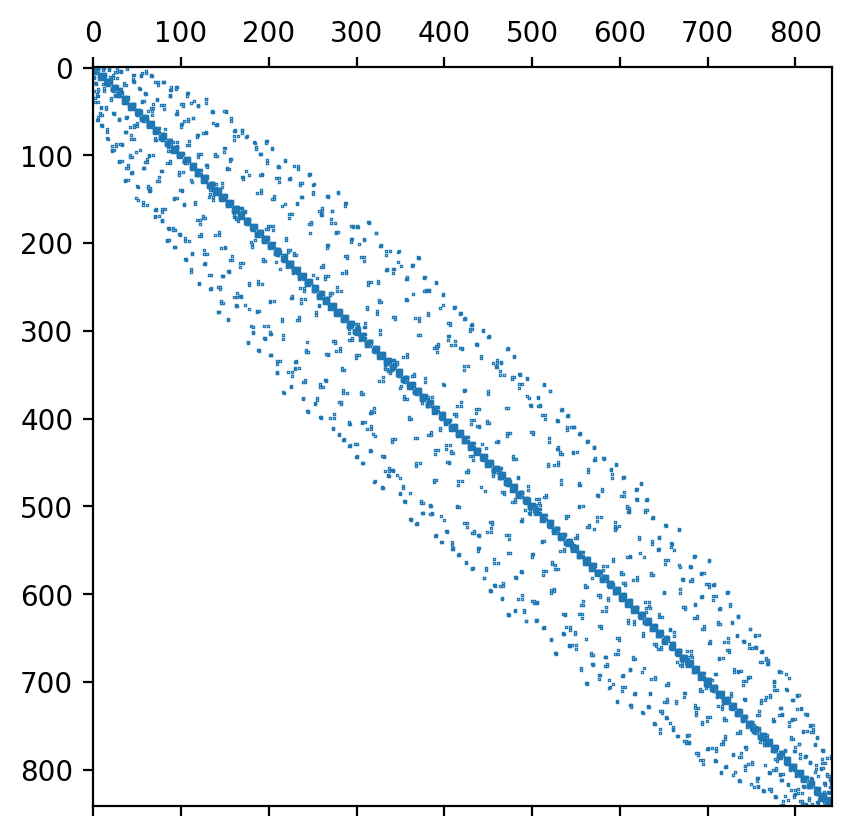

In [9]:
# the adjacency matrix has all ones on the diagonal
plt.spy(hadjmat, markersize=0.2);

We now normalize the adjacency matrix. This is common practice in machine learning.

L1-norm: https://math.stackexchange.com/questions/4014974/understanding-l1-and-l2-norms


In [10]:
from sklearn.preprocessing import normalize

hadjmat_normed = normalize(hadjmat, norm="l1", axis=1)
hadjmat_normed.data = 1.0 - hadjmat_normed.data
hadjmat_normed

<842x842 sparse matrix of type '<class 'numpy.float64'>'
	with 5052 stored elements in Compressed Sparse Row format>

The graph we have defined (through the adjacency matrix) should NOT contain any isolated nodes! (Why?)

Let's add a check for this (always best to test that our code has produced a plausible result...)

In [11]:
h_to_h_has_isolated = torch_geometric.utils.contains_isolated_nodes(
    torch_geometric.utils.from_scipy_sparse_matrix(hadjmat_normed)[0]
)

assert not h_to_h_has_isolated, "Error! Time for some debugging..."

In [12]:
h2h_graph_key = ("h", "to", "h")

h2h_graph_data = {
    "edge_index": torch.from_numpy(np.stack([hadjmat.col, hadjmat.row], axis=0).astype(np.int64)),
    "edge_attr": torch.from_numpy(np.expand_dims(hadjmat_normed.data, axis=-1).astype(np.float32)),
    "hcoords_rad": torch.from_numpy(hcoords_rad.astype(np.float32)),
    "info": "h3_to_h3 graph",
}

### Exercise

**Graph features**

Add the edge direction (`target node location - source node location`) to the edge feature tensor.

In [13]:
# ADD YOUR CODE HERE!

### Solution

In [14]:
def augment_h2h_edge_features(graph_data):
    
    print(f"Old shape of edge feature tensor: {graph_data['edge_attr'].shape}")

    h2h_edge_dirs = []

    for n in range(graph_data['edge_index'].shape[1]):
        i,j = graph_data['edge_index'][:,n]
        ic = graph_data['hcoords_rad'][i,:]
        jc = graph_data['hcoords_rad'][j,:]
        h2h_edge_dirs.append(jc - ic)

    h2h_edge_dirs = torch.from_numpy(np.stack(h2h_edge_dirs).astype(np.float32))
    h2h_edge_attr = torch.concat([graph_data['edge_attr'], h2h_edge_dirs], axis=-1)
    print(f"New shape of edge feature tensor: {h2h_edge_attr.shape}")

    graph_data["edge_attr"] = h2h_edge_attr
    
    return graph_data

h2h_graph_data = augment_h2h_edge_features(h2h_graph_data)
h2h_graph_data["edge_attr"].shape

Old shape of edge feature tensor: torch.Size([5052, 1])
New shape of edge feature tensor: torch.Size([5052, 3])


torch.Size([5052, 3])

In [15]:
assert h2h_graph_data["edge_attr"].shape[-1] == 3, \
    "You have more edge features than you should. Did you run the `Solutions` cell multiple times?"

### The "ERA -> H3" (bipartite) graph

Recall:

A **bipartite graph** is a graph where the vertices can be divided into two disjoint sets such that all edges connect a vertex in one set to a vertex in another set. _There are no edges between vertices in the disjoint sets._

In [16]:
NUM_ERA_NEIGHBORS = 1 # this is not important - we set it to 1 to speed up the NN generation)
RADIUS_EARTH = 6371.0  # in km
H_CUTOFF = 800 # cutoff radius for ERA -> H graph, in km
RADIUS_H_TO_ERA= H_CUTOFF / RADIUS_EARTH

In [17]:
eneigh = NearestNeighbors(n_neighbors=NUM_ERA_NEIGHBORS, metric="haversine", n_jobs=2)
eneigh.fit(ecoords_rad)

# we build a nearest neighbor graph, this time using a radius cutoff
era_to_h3_adjmat = eneigh.radius_neighbors_graph(
    hcoords_rad,
    radius=RADIUS_H_TO_ERA,
).tocoo()
era_to_h3_adjmat

<842x10944 sparse matrix of type '<class 'numpy.float64'>'
	with 36299 stored elements in COOrdinate format>

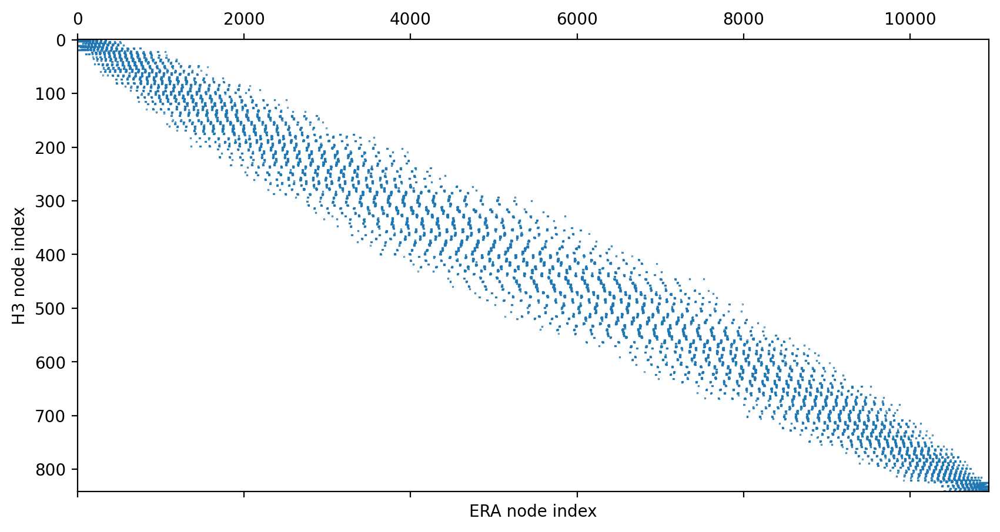

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(10,5))

ax.spy(era_to_h3_adjmat, markersize=0.1, aspect="auto");
ax.set_xlabel("ERA node index");
ax.set_ylabel("H3 node index");

In [19]:
# normalization
era_to_h3_adjmat_norm = normalize(era_to_h3_adjmat, norm="l1", axis=1)
era_to_h3_adjmat_norm.data = 1.0 - era_to_h3_adjmat_norm.data
era_to_h3_adjmat_norm

<842x10944 sparse matrix of type '<class 'numpy.float64'>'
	with 36299 stored elements in Compressed Sparse Row format>

In [20]:
era_h_has_isolated = torch_geometric.utils.contains_isolated_nodes(
    torch_geometric.utils.from_scipy_sparse_matrix(era_to_h3_adjmat_norm)[0]
)
assert not era_h_has_isolated

**Question:** Can the ERA -> H3 bipartite mapping have isolated nodes?

In [21]:
e2h_graph_key = ("era", "to", "h")

e2h_graph_data = {
    # NB: we MUST SWAP ROWS AND COLUMNS when building the edge index!
    "edge_index": torch.from_numpy(np.stack([era_to_h3_adjmat.col, era_to_h3_adjmat.row], axis=0).astype(np.int64)),
    "edge_attr": torch.from_numpy(np.expand_dims(era_to_h3_adjmat_norm.data, axis=-1).astype(np.float32)),
    "hcoords_rad": torch.from_numpy(hcoords_rad.astype(np.float32)),
    "ecoords_rad": torch.from_numpy(ecoords_rad.astype(np.float32)),
    "info": "era_to_h3 graph",
}

For convenience, we wrap the both graph data dictionaries in a `HeteroData` object.

In [22]:
from torch_geometric.data import HeteroData

graphs = HeteroData(
    {
       e2h_graph_key : e2h_graph_data,
       h2h_graph_key: h2h_graph_data,
    }
)

### Visualize the graphs

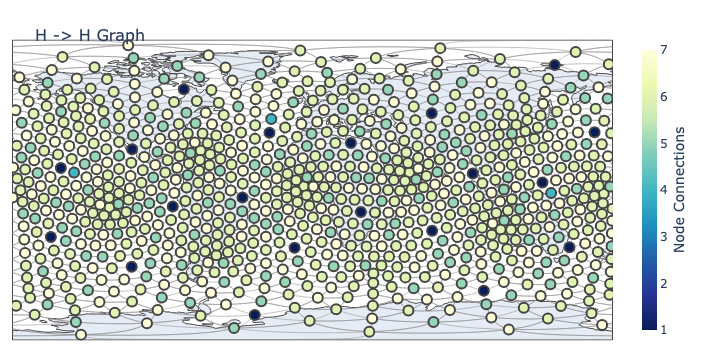

In [23]:
from plot_utils import plot_bipartite_graph, plot_graph

plot_graph(
    "H -> H Graph",
    graphs[("h", "to", "h")],
    'hcoords_rad'
)

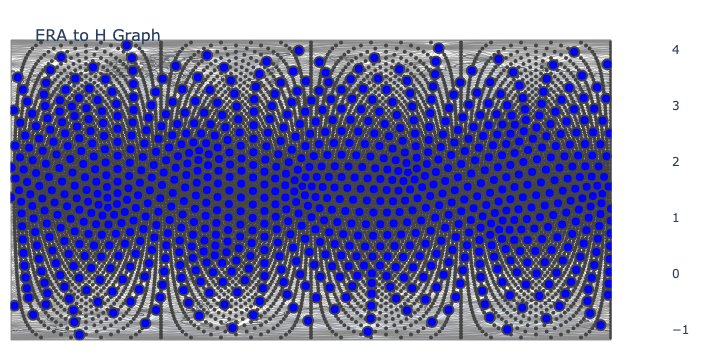

In [24]:
plot_bipartite_graph(
    "ERA to H Graph",
    "blue",
    graphs[("era", "to", "h")],
    ('ecoords_rad', 'hcoords_rad'),
    graphs[("era", "to", "h")]['ecoords_rad'],
    graphs[("era", "to", "h")]['hcoords_rad']
)

## Let's build some GNN layers!

First, we will write a simple MLP layer using torch. This will be the building block for the GNN layers that we define afterwards.

If you're not very familiar with pytorch, you may want to have a look at https://pytorch.org/tutorials/beginner/nn_tutorial.html

### MLP

In [25]:
from torch import nn

def generate_mlp_module(num_inputs: int = 32, hidden_dim: int = 64, num_outputs: int = 32):
    mlp = nn.Sequential(
        nn.Linear(num_inputs, hidden_dim),
        nn.LeakyReLU(0.1),
        nn.Linear(hidden_dim, hidden_dim),
        nn.LeakyReLU(0.1),
        nn.Linear(hidden_dim, num_outputs),
        nn.LeakyReLU(0.1),
        nn.LayerNorm(num_outputs)
    )
    return mlp

It's always good to test that your code does what you want it to do:

In [26]:
num_in = 16
num_hid = 64
num_out = 32

test_mlp = generate_mlp_module(num_in, num_hid, num_out)

x_input = torch.randn(1024, num_in)
x_output = test_mlp(x_input)  # should return a tensor with shape (1024, 32)

assert x_output.shape == (1024, num_out), f"Shape error! Expected (1024, {num_out}) and got {x_output.shape}!"

### Processor layer

In [27]:
from torch_geometric.nn.conv import MessagePassing
from torch_geometric.typing import Adj, OptPairTensor, Size
from typing import Optional, Tuple

class NodeEdgeInteractions(MessagePassing):
    """Message passing module for node and edge interactions."""

    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        **kwargs,
    ):
        super().__init__(**kwargs)

        self.edge_mlp = generate_mlp_module(
            3 * in_channels,
            out_channels,
            out_channels,
        )

    def forward(self, x: torch.Tensor, edge_index: Adj, edge_attr: torch.Tensor, size: Size = None):
        out, edges_new = self.propagate(edge_index, x=x, edge_attr=edge_attr, size=size, dim_size=x.shape[0])
        return out, edges_new

    def message(self, x_i: torch.Tensor, x_j: torch.Tensor, edge_attr: torch.Tensor, dim_size = None):
        return self.edge_mlp(torch.cat([x_i, x_j, edge_attr], dim=1)) + edge_attr

    def aggregate(self, edges_new: torch.Tensor, edge_index: Adj, dim_size = None):
        out = scatter(edges_new, edge_index[1], dim=0, dim_size=dim_size, reduce="sum")
        return out, edges_new

In [28]:
from torch_geometric.utils import scatter

class GNNProcessor(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        edge_dim: int,
    ):
        super().__init__()
        self.edge_dim = edge_dim
        
        self.edge_embedding = generate_mlp_module(
            edge_dim,
            out_channels,
            out_channels,
        )
        
        self.node_mlp = generate_mlp_module(
            2 * in_channels,
            out_channels,
            out_channels,
        )

        self.mp = NodeEdgeInteractions(
            in_channels=in_channels,
            out_channels=out_channels,
        )
        
    def forward(
        self,
        x: torch.Tensor,
        edge_index: Adj,
        edge_attr: torch.Tensor,
        size: Size = None,
    ):
        if self.edge_dim == edge_attr.shape[-1]:
            # embed the edges into the latent dimension
            edge_attr_new = self.edge_embedding(edge_attr)
        else:
            # no edge embedding
            edge_attr_new = edge_attr
        out, edges_new = self.mp(x, edge_index, edge_attr_new, size=size)
        nodes_new = self.node_mlp(torch.cat([x, out], dim=1)) + x
        return nodes_new, edges_new

In [29]:
H3_SIZE = hcoords_rad.shape[0]

num_h3_features = 64

h_processor = GNNProcessor(
    in_channels=num_h3_features,
    out_channels=num_h3_features,
    edge_dim=graphs[("h", "to", "h")]["edge_attr"].shape[-1]
)

x_input_h = torch.randn(H3_SIZE, num_h3_features)

x_output_h, _ = h_processor(
    x=x_input_h,
    edge_index=graphs[("h", "to", "h")]["edge_index"],
    edge_attr=graphs[("h", "to", "h")]["edge_attr"]
)

assert x_output_h.shape == (H3_SIZE, num_h3_features), \
    f"Shape error: got {x_output_h.shape} and expected ({H3_SIZE}, {num_h3_features})!"

### Mapper layer

Below we build an attentional "mapper" layer. This can be used to map information from the ERA to the H3 grid.

Recall the high-level mechanism of an attentional GNN (middle diagram):

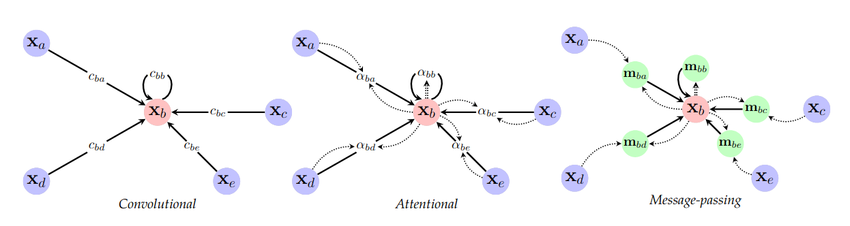

Recall that graph transformers work best when provided with a context tensor that encodes positional information about the nodes.

In [30]:
import einops
import torch_geometric.nn as tgnn

from torch_geometric.nn.conv import MessagePassing
from torch_geometric.typing import Adj
from typing import Optional

class TransformerMapper(MessagePassing):
    """Transformer mapper layer."""

    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        context_size: int,
        dynamic_context_channels: int = 0,
        num_attn_heads: int = 1,
        dropout: float = 0.0,
        edge_dim: int = 3,
    ) -> None:
        """
        Arguments
        ----------
        in_channels : int
            Number of input channels.
        out_channels : int
            Number of output channels.
        context_size : int
            Size of the context vector.
        dynamic_context_channels : int, optional
            Number of dynamic context channels, by default 0
        num_attn_heads : int, optional
            Number of attention heads, by default 1
        dropout : float, optional
            Dropout probability, by default 0.0
        edge_dim : int, optional
            Edge feature dimension, by default 3
        """
        super().__init__()
        self.dynamic_context_channels = dynamic_context_channels

        if self.dynamic_context_channels > 0:
            self.conv = tgnn.GATConv(
                # bipartite graph
                in_channels=(in_channels, dynamic_context_channels),
                out_channels=out_channels,
                heads=num_attn_heads,
                dropout=dropout,
                edge_dim=edge_dim,
                add_self_loops=False,
            )
        else:
            self.conv = tgnn.GATConv(
                in_channels=in_channels,
                out_channels=out_channels,
                heads=num_attn_heads,
                dropout=dropout,
                add_self_loops=False,
                edge_dim=edge_dim,
            )

    def forward(
        self,
        x: torch.Tensor,
        edge_index: Adj,
        edge_attr: Optional[torch.Tensor] = None,
        dynamic_context: Optional[torch.Tensor] = None,
        batch_size: int = 1,
    ) -> torch.Tensor:
        context = None

        if dynamic_context is not None:
            # check that the context tensor shape matches what we expect
            assert (
                dynamic_context.shape[1] == self.dynamic_context_channels
            ), f"Expected {dynamic_context.shape[1]} dynamic context channels and got {self.dynamic_context_channels}!"
            context = dynamic_context

        if context is not None:
            if batch_size > 1:
                context = einops.repeat(context, "n f -> (repeat n) f", repeat=batch_size)
            assert edge_index[0].max() < x.size(0) and edge_index[1].max() < context.size(0), \
                "Your edge index tensor contains invalid entries."
            out = self.conv(
                x=(x, context),
                edge_index=edge_index,
                edge_attr=edge_attr,
                size=(x.shape[0], context.shape[0]),
            )
        else:
            out = self.conv(x=x, edge_index=edge_index, edge_attr=edge_attr)

        return out

Let's run a quick test on made-up data - to make sure the output dimensions match what we expect ...

In [31]:
ERA_SIZE = ecoords_rad.shape[0]
H3_SIZE = hcoords_rad.shape[0]

num_era_features = 32
num_h3_features = 64
num_context_features = 2 # latitude and longitude of target locations
num_attn_heads = 2

era_to_h_mapper = TransformerMapper(
    in_channels=num_era_features,
    out_channels=num_h3_features,
    context_size=H3_SIZE,
    dynamic_context_channels=2,
    num_attn_heads=num_attn_heads,
    dropout=0.1,
    edge_dim=graphs[("era", "to", "h")]["edge_attr"].shape[-1],
)

x_input_era = torch.randn(ERA_SIZE, num_era_features)  # [40320, 32]
x_context_h3 = graphs[("era", "to", "h")]["hcoords_rad"]  # [5882, 2]

x_output_h = era_to_h_mapper(
    x=x_input_era,
    edge_index=graphs[("era", "to", "h")]["edge_index"],
    edge_attr=graphs[("era", "to", "h")]["edge_attr"],
    dynamic_context=graphs[("era", "to", "h")]["hcoords_rad"],
    batch_size=1,
)

assert x_output_h.shape == (H3_SIZE, num_h3_features * num_attn_heads), \
    f"Shape error: got {x_output_h.shape} and expected ({H3_SIZE}, {num_h3_features * num_attn_heads})!"

#### Homework exercise 1

The `GATConv` layer computes a very limited kind of attention: the ranking of the attention scores is unconditioned on the query node. Because GATs use this "static" attention mechanism, there are simple graph problems that GAT cannot express. To remove this limitation, https://arxiv.org/abs/2105.14491 introduces a simple fix by modifying the order of operations and proposes GATv2: a dynamic graph attention variant that is demonstrated to be strictly more expressive than GAT.

Re-implement the mapper to use dynamic attention.

Hint: use `torch.geometric.nn.conv.GATv2Conv`

https://pytorch-geometric.readthedocs.io/en/latest/generated/torch_geometric.nn.conv.GATv2Conv.html

#### Homework exercise 2

Extend the GNN layers defined above to support batch sizes > 1.

Hint: https://pytorch-geometric.readthedocs.io/en/latest/advanced/batching.html

### Exercise: Message-passing - implementing a GNN layer

Wang et al. (https://arxiv.org/pdf/1801.07829.pdf) proposed an _edge convolution layer_ that is mathematically defined as follows:

$$
x_i^{new} = \max_{j \in N(i)} \mathrm{MLP}(x_i, x_j - x_i)
$$

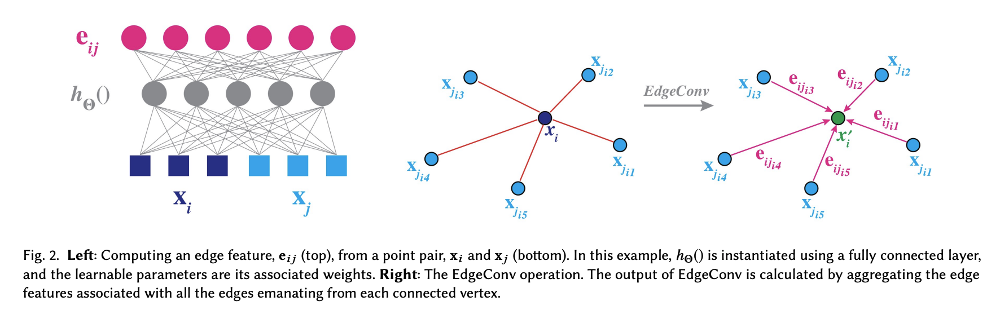

Can you implement this layer as a `pyg` `MessagePassing` class? Feel free to reuse the MLP block defined above.

In [32]:
class EdgeConvolution(MessagePassing):
    def __init__(self, in_channels, out_channels):
        pass
        # super().__init__(... your code here ...)
        # self.edge_mlp = ... your code here ...

    def message(self, x_i, x_j):
        pass
        # x_i and x_j have both shape [E, in_channels]
        # your code here ...
    
    def forward(self, x: torch.Tensor, edge_index: torch.Tensor) -> torch.Tensor:
        pass
        # your code here ...

#### Solution

In [33]:
class EdgeConvolution(MessagePassing):
    def __init__(self, in_channels, out_channels):
        super().__init__(aggr='max')
        
        self.edge_mlp = generate_mlp_module(
            2 * in_channels,
            out_channels,
            out_channels,
        )

    def message(self, x_i, x_j):
        # x_i and x_j have both shape [E, in_channels]
        tmp = torch.cat([x_i, x_j - x_i], dim=1)
        return self.mlp(tmp)
    
    def forward(self, x: torch.Tensor, edge_index: torch.Tensor) -> torch.Tensor:
        return self.propagate(edge_index, x=x)